In [1]:
import selenium
from selenium.webdriver import *
from selenium import webdriver
import time
import sys
import numpy as np

In [4]:
chrome_driver = 'C:/chromedriver.exe'
driver = webdriver.Chrome(chrome_driver)

In [2]:
import pandas as pd
from bs4 import BeautifulSoup as bs
from html_table_parser.parser import HTMLTableParser as parser

http://www.statiz.co.kr/stat.php?mid=stat&re=1&ys=2014&ye=2020&se=0&te=&tm=&ty=0&qu=auto&po=0&as=&ae=&hi=&un=&pl=&da=1&o1=WAR&o2=OutCount&de=1&lr=0&tr=&cv=&ml=1&pa=0&si=&cn=&sn=1744


1. 여기 있는 투수들 링크 모두 따기
2. 중복된 링크는 제거
3. 종합->연도별 테이블이 나오도록 링크 수정
4. 리스트에 있는 모든 투수에 대해 크롤링

In [7]:
driver=webdriver.Chrome(chrome_driver)

In [888]:
driver.get('http://www.statiz.co.kr/stat.php?opt=0&sopt=0&re=1&ys=2014&ye=2020&se=0&te=&tm=&ty=0&qu=auto&po=0&as=&ae=&hi=&un=2&pl=&da=1&o1=OutCount&o2=OutCount&de=1&lr=0&tr=&cv=&ml=1&sn=436&si=&cn=SIP,50,0,SO,,0')
url=driver.find_elements_by_xpath('//*[@id="mytable"]/tbody/tr/td[2]/a')
Foreign=[link.get_attribute('href') for link in url ]
foreign_URL=[]
for url in Foreign:
    if url not in foreign_URL:
        foreign_URL.append(url)
foreign_URL=['{}opt=1&name={}'.format(i[0:35],i[40:]) for i in foreign_URL]

In [889]:
driver.get('http://www.statiz.co.kr/stat.php?mid=stat&re=1&ys=2014&ye=2020&se=0&te=&tm=&ty=0&qu=auto&po=0&as=&ae=&hi=&un=&pl=&da=1&o1=OutCount&o2=OutCount&de=1&lr=0&tr=&cv=&ml=1&sn=436&si=&cn=SIP,50,0,SO,,0')
url=driver.find_elements_by_xpath('//*[@id="mytable"]/tbody/tr/td[2]/a')
URL=[link.get_attribute('href') for link in url ]

new_URL=[]
for url in URL:
    if url not in new_URL:
        new_URL.append(url)
new_URL=['{}opt=1&name={}'.format(i[0:35],i[40:]) for i in new_URL]

In [890]:
domestic_url=[]
for url in new_URL:
    if url not in foreign_URL:
        domestic_url.append(url)

In [891]:
len(domestic_url),len(foreign_URL),len(new_URL)

(131, 99, 222)

스탯티즈 상에서 필요한 데이터 크롤링과 전처리 과정 구현

In [1136]:
from html_table_parser import parser_functions as parser
from selenium.webdriver.common.keys import Keys
class full_crawling:

    def __init__(self,url,foreign):
        self.url = url
        self.foreign=foreign
    def crawling(self):
        driver.get(self.url)
        time.sleep(0.6)
        name = driver.find_element_by_xpath(
            '/html/body/div[1]/div[1]/div/section[2]/div/div[1]/div/div[1]/div/div[2]/button/font'
        ).text
        Exam2 = pd.DataFrame()
        for i in range(0, 2):
            driver.execute_script(
                "window.scrollTo(0,document.body.scrollHeight)")
            if i == 1:
                time.sleep(1)
                driver.get(self.url + '&re=1&se=0&da=2')
                time.sleep(0.5)
                driver.execute_script(
                    "window.scrollTo(0,document.body.scrollHeight)")
            source = driver.page_source
            soup = bs(source, 'html.parser')
            pd.set_option('display.max_column', None)
            Exam = pd.DataFrame(parser.make2d(soup.find_all('table')[2]))
            Exam.columns = Exam.loc[0]
            Exam = Exam[Exam['연도'] != "연도"]
            Exam = Exam[Exam['팀'] != "통산"]
            if i == 1:
                Table = pd.concat([Exam2, Exam], axis=1)
                Table.insert(0, "이름", name)
            Exam2 = Exam
        self.table = Table
a        return Table

    def process(self):
        Table2={}
        Table2 = self.table
        Table2.reset_index(drop=True, inplace=True)
        Table2 = Table2[['이름', '연도', '나이', '출장', '선발', '이닝', '투구']]
        Table2 = Table2.iloc[:, [0, 2, 4, 6, 7, 8, 10]]
        colnames = ['연도', '나이', '출장', '선발', '이닝', '투구']
        Table2[colnames] = Table2[colnames].apply(pd.to_numeric,
                                                  errors='coerce')
        Table2['투구'].fillna(0,inplace=True)
        Table2['선발'].fillna(0,inplace=True)
        Table2['출장'].fillna(0,inplace=True)
        Table2['이닝'].fillna(0,inplace=True)

        Table2['유망주'] = np.where(Table2['나이'] <= 24, 1, 0).astype('float')
        Table2 = Table2.dropna(subset=['연도'])
        Service_yr = []
        debut = []
        Table2['연차'] = 0
        Table2['가중이닝']=0                                
        Table2['가중출장']=0    
        Table2['누적이닝']=0    
        Table2['투구'].astype('float')
        Table2['이닝'].astype('float')
        Table2['출장'].astype('float')

        Table2.reset_index(drop=True, inplace=True)
        
        if self.foreign==1:
            
            if (Table2.loc[0,['나이']]>21).bool():
                for i in np.arange(0,len(Table2)):
                    Table2.loc[i,['연차']]=int(Table2.loc[i,['나이']]-22)
            else:
                Table2.loc[i,['연차']]=np.arange(1,len(Table2)+1)
            
                
            for i in np.arange(0,len(Table2)):
                    if (Table2.loc[0,['이닝']]>=100).bool():
                        Table2.loc[0,['가중이닝']]=float(Table2.loc[0,['이닝']])+float(Table2.loc[0,['이닝']])*0.7*(0.7+0.5)
                        Table2.loc[0,['가중출장']]=float(Table2.loc[0,['출장']])+float(Table2.loc[0,['출장']])*0.7*(0.7+0.5)
                        Table2.loc[0,['가중투구']]=float(Table2.loc[0,['투구']])+float(Table2.loc[0,['투구']])*0.7*(0.7+0.5)

                    elif (Table2.loc[0,['이닝']]<100).bool():
                        Table2.loc[0,['가중이닝']]=float(Table2.loc[0,['이닝']])*(1+0.7+0.5)
                        Table2.loc[0,['가중출장']]=float(Table2.loc[0,['출장']])*(1+0.7+0.5)
                        Table2.loc[0,['가중투구']]=float(Table2.loc[0,['투구']])*(1+0.7+0.5)
                    if i==0:
                        continue
                    if i==1:
                        one_yr=int(Table2.loc[i,['연도']]-1)
                        try: 
                            prev_yr=float(Table2[Table2['연도']==one_yr]['이닝'])
                            prev_yr_ball=float(Table2[Table2['연도']==one_yr]['투구'])
                            prev_yr_game=float(Table2[Table2['연도']==one_yr]['출장'])                               
                        except:
                            prev_yr=0
                            prev_yr_ball=0
                            prev_yr_game=0
                        Table2.loc[i,['가중이닝']]=prev_yr*0.7+float(Table2.loc[i,['이닝']])+prev_yr*0.7*0.5
                        Table2.loc[i,['가중투구']]=prev_yr_ball*0.7+float(Table2.loc[i,['투구']])+prev_yr_ball*0.7*0.5
                        Table2.loc[i,['가중출장']]=prev_yr_game*0.7+float(Table2.loc[i,['출장']])+prev_yr_game*0.7*0.5

                    elif i>=2:
                        one_yr=int(Table2.loc[i,['연도']]-1)
                        two_yr=int(Table2.loc[i,['연도']]-2)
                               
                        try: 
                            prev_yr=float(Table2[Table2['연도']==one_yr]['이닝'])
                            prev_yr_ball=float(Table2[Table2['연도']==one_yr]['투구'])
                            prev_yr_game=float(Table2[Table2['연도']==one_yr]['출장'])
                        except:
                            prev_yr=0
                            prev_yr_ball=0
                            prev_yr_game=0
                        try: 
                            twoprev_yr=float(Table2[Table2['연도']==two_yr]['이닝'])
                            twoprev_yr_ball=float(Table2[Table2['연도']==two_yr]['투구'])
                            twoprev_yr_game=float(Table2[Table2['연도']==two_yr]['출장'])
                        except:
                            twoprev_yr=0
                            twoprev_yr_ball=0
                            twoprev_yr_game=0
                        Table2.loc[i,['가중이닝']]=prev_yr*0.7+twoprev_yr*0.5+float(Table2.loc[i,['이닝']])
                        Table2.loc[i,['가중투구']]=prev_yr_ball*0.7+twoprev_yr_ball*0.5+float(Table2.loc[i,['투구']])
                        Table2.loc[i,['가중출장']]=prev_yr_game*0.7+twoprev_yr_game*0.5+float(Table2.loc[i,['출장']])
            
            Table2['누적이닝']=1

        elif self.foreign==0:
            for i in range(0, len(Table2)):
                if Table2.iloc[i, 5] > 40.0:
                    debut.append(i)
            start = debut[0]
            if debut is None:
                Table2['연차'] = 0
            else:
                for k in np.arange(start, len(Table2)):
                    Service_yr.append(
                        abs((int(Table2.iloc[start, 1]) -
                             int(Table2.iloc[k, 1]))) + 1)
                Table2.loc[start:k, ['연차']] = Service_yr
                           
            for i in np.arange(0,len(Table2)):
                if i==0:
                    Table2.loc[i,['가중이닝']]=float(Table2.loc[i,['이닝']])
                    Table2.loc[i,['가중투구']]=float(Table2.loc[i,['투구']])
                    Table2.loc[i,['가중출장']]=float(Table2.loc[i,['출장']])

                elif i==1:
                    one_yr=int(Table2.loc[i,['연도']]-1)
                    try: 
                        prev_yr=float(Table2[Table2['연도']==one_yr]['이닝'])
                        prev_yr_ball=float(Table2[Table2['연도']==one_yr]['투구'])
                        prev_yr_game=float(Table2[Table2['연도']==one_yr]['출장'])
                    except:
                        prev_yr=0
                        prev_yr_ball=0
                        prev_yr_game=0
                    Table2.loc[i,['가중이닝']]=prev_yr*0.7+float(Table2.loc[i,['이닝']])
                    Table2.loc[i,['가중투구']]=prev_yr_ball*0.7+float(Table2.loc[i,['투구']])
                    Table2.loc[i,['가중출장']]=prev_yr_game*0.7+float(Table2.loc[i,['출장']])

                elif i>=2:
                    one_yr=int(Table2.loc[i,['연도']]-1)
                    two_yr=int(Table2.loc[i,['연도']]-2)
                    try: 
                        prev_yr=float(Table2[Table2['연도']==one_yr]['이닝'])
                        prev_yr_ball=float(Table2[Table2['연도']==one_yr]['투구'])
                        prev_yr_game=float(Table2[Table2['연도']==one_yr]['출장'])

                    except:
                        prev_yr=0
                        prev_yr_ball=0
                        prev_yr_game=0
                    try: 
                        twoprev_yr=float(Table2[Table2['연도']==two_yr]['이닝'])
                        twoprev_yr_ball=float(Table2[Table2['연도']==two_yr]['투구'])
                        twoprev_yr_game=float(Table2[Table2['연도']==two_yr]['출장'])

                    except:
                        twoprev_yr=0
                        twoprev_yr_ball=0
                        twoprev_yr_game=0
                    Table2.loc[i,['가중이닝']]=prev_yr*0.7+twoprev_yr*0.5+float(Table2.loc[i,['이닝']])
                    Table2.loc[i,['가중투구']]=prev_yr_ball*0.7+twoprev_yr_ball*0.5+float(Table2.loc[i,['투구']])
                    Table2.loc[i,['가중출장']]=prev_yr_game*0.7+twoprev_yr_game*0.5+float(Table2.loc[i,['출장']])

            for i in np.arange(0,len(Table2)):
                if float(np.sum(Table2.loc[0:i,['이닝']]))>400:
                    Table2.loc[i,['누적이닝']]=1
        
        
        return Table2

In [1156]:
driver = webdriver.Chrome(chrome_driver)

In [1142]:
Table_total = pd.DataFrame()

In [1158]:
for idx, url in enumerate(domestic_url):
    FC = full_crawling(url,0)
    FC.crawling()
    Table2 = FC.process()
    Table_total = pd.concat([Table_total, Table2])
    time.sleep(1)
    name2 = driver.find_element_by_xpath(
        '/html/body/div[1]/div[1]/div/section[2]/div/div[1]/div/div[1]/div/div[2]/button/font'
    ).text
    print(str(idx) + '/' + str(len(domestic_url)), name2)
    print(Table2)

0/222 양현종
0    이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0   양현종  2007  19  31   6   49.2     0.0  1.0   1   49.20  31.0     0     0.0
1   양현종  2008  20  48   9   75.2     0.0  1.0   2  109.64  69.7     0     0.0
2   양현종  2009  21  29  24  148.2     0.0  1.0   3  225.44  78.1     0     0.0
3   양현종  2010  22  30  30  169.1     0.0  1.0   4  310.44  74.3     1     0.0
4   양현종  2011  23  28  22  106.1     0.0  1.0   5  298.57  63.5     1     0.0
5   양현종  2012  24  28   5   41.0     0.0  1.0   6  199.82  62.6     1     0.0
6   양현종  2013  25  19  17  104.2     0.0  0.0   7  185.95  52.6     1     0.0
7   양현종  2014  26  29  29  171.1  2878.0  0.0   8  264.54  56.3     1  2878.0
8   양현종  2015  27  32  31  184.1  3040.0  0.0   9  355.97  61.8     1  5054.6
9   양현종  2016  28  31  31  200.1  3207.0  0.0  10  414.52  67.9     1  6774.0
10  양현종  2017  29  31  31  193.1  3085.0  0.0  11  425.22  68.7     1  6849.9
11  양현종  2018  30  29  29  184.1  2883.0  0.0  12  419

8/222 신재영
0   이름    연도  나이  출장  선발     이닝    투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  신재영  2016  27  30  30  168.2  2655  0.0   1  168.20  30.0     0  2655.0
1  신재영  2017  28  34  15  125.0  1866  0.0   2  242.74  55.0     0  3724.5
2  신재영  2018  29  26  21  101.1  1695  0.0   3  272.70  64.8     0  4328.7
3  신재영  2019  30  12   6   29.1   510  0.0   4  162.37  47.2     1  2629.5
4  신재영  2020  31   7   0    5.0   121  0.0   5   75.92  28.4     1  1325.5
5  신재영  2021  32  20   1   28.1   450  0.0   6   46.15  30.9     1   789.7
9/222 이영하
0   이름    연도  나이  출장  선발     이닝    투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  이영하  2017  20  20   3   35.2   616  1.0   0   35.20  20.0     0   616.0
1  이영하  2018  21  40  17  122.2  2103  1.0   1  146.84  54.0     0  2534.2
2  이영하  2019  22  29  27  163.1  2646  1.0   2  266.24  67.0     0  4426.1
3  이영하  2020  23  42  19  132.0  2235  1.0   3  307.27  82.3     1  5138.7
4  이영하  2021  24  35  11   78.2  1381  1.0   4  252.15  78.9     1  4268.5
10/22

19/222 이태양
0   이름      연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝   가중출장  누적이닝  \
0  이태양  2012.0  22   1   0    2.0     0.0  1.0   0    2.00    1.0     0   
1  이태양  2013.0  23  31   5   60.2     0.0  1.0   1   61.60   31.7     0   
2  이태양  2014.0  24  30  26  153.0  2646.0  1.0   2  196.14   52.2     0   
3  이태양  2016.0  26  29  25  112.1  1975.0  0.0   4  188.60   44.0     0   
4  이태양  2017.0  27  16  12   59.0  1118.0  0.0   5  137.47   36.3     0   
5  이태양  2018.0  28  63   0   79.1  1306.0  0.0   6  176.45   88.7     1   
6  이태양  2019.0  29  55   1   66.2  1083.0  0.0   7  151.07  107.1     1   
7  이태양  2020.0  30  53   0   56.0   939.0  0.0   8  141.89  123.0     1   
8  이태양  2021.0  31  40  14  103.2  1644.0  0.0   9  175.50  104.6     1   

0    가중투구  
0     0.0  
1     0.0  
2  2646.0  
3  3298.0  
4  2500.5  
5  3076.1  
6  2556.2  
7  2350.1  
8  2842.8  
20/222 김민
0  이름    연도  나이  출장  선발     이닝    투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  김민  2018  19   9   9   37.1   6

32/222 장현식
0   이름      연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝   가중출장  누적이닝  \
0  장현식  2013.0  18   2   0    2.0     0.0  1.0   0    2.00    2.0     0   
1  장현식  2015.0  20   2   0    2.0    45.0  1.0   0    2.00    2.0     0   
2  장현식  2016.0  21  37   5   76.1  1317.0  1.0   1   77.50   38.4     0   
3  장현식  2017.0  22  31  22  134.1  2488.0  1.0   2  188.37   57.9     0   
4  장현식  2018.0  23  21   0   26.2   523.0  1.0   3  158.12   61.2     0   
5  장현식  2019.0  24  53   0   54.2  1005.0  1.0   4  139.59   83.2     0   
6  장현식  2020.0  25  37   3   41.0   821.0  0.0   5   92.04   84.6     0   
7  장현식  2021.0  26  69   0   76.2  1307.0  0.0   6  132.00  121.4     1   

0    가중투구  
0     0.0  
1    45.0  
2  1348.5  
3  3432.4  
4  2923.1  
5  2615.1  
6  1786.0  
7  2384.2  
33/222 주권
0  이름    연도  나이  출장  선발     이닝    투구  유망주  연차    가중이닝   가중출장  누적이닝    가중투구
0  주권  2015  20  15   3   24.1   480  1.0   0   24.10   15.0     0   480.0
1  주권  2016  21  28  26  134.0  2212  1.0   1

42/222 송승준
0    이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0   송승준  2007  27  25  17  117.0     0.0  0.0   1  117.00  25.0     0     0.0
1   송승준  2008  28  26  26  153.1     0.0  0.0   2  235.00  43.5     0     0.0
2   송승준  2009  29  29  29  167.2     0.0  0.0   3  332.87  59.7     1     0.0
3   송승준  2010  30  27  27  168.0     0.0  0.0   4  361.59  60.3     1     0.0
4   송승준  2011  31  30  29  172.1     0.0  0.0   5  373.30  63.4     1     0.0
5   송승준  2012  32  28  28  163.0     0.0  0.0   6  367.47  62.5     1     0.0
6   송승준  2013  33  29  29  167.2     0.0  0.0   7  367.35  63.6     1     0.0
7   송승준  2014  34  24  23  122.0  2251.0  0.0   8  320.54  58.3     1  2251.0
8   송승준  2015  35  25  23  125.0  2264.0  0.0   9  294.00  56.3     1  3839.7
9   송승준  2016  36  10  10   41.1   822.0  0.0  10  189.60  39.5     1  3532.3
10  송승준  2017  37  30  22  130.1  2245.0  0.0  11  221.37  49.5     1  3952.4
11  송승준  2018  38  22  15   79.0  1438.0  0.0  12  19

50/222 이건욱
0   이름    연도  나이  출장  선발     이닝    투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  이건욱  2016  21   1   0    0.2    12  1.0   0    0.20   1.0     0    12.0
1  이건욱  2017  22   2   0    1.1    54  1.0   0    1.24   2.7     0    62.4
2  이건욱  2020  25  27  25  122.0  2241  0.0   1  122.00  27.0     0  2241.0
3  이건욱  2021  26   5   4   12.2   284  0.0   2   97.60  23.9     0  1852.7
51/222 장민재
0   이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  장민재  2010  20  13   1   16.1     0.0  1.0   0   16.10  13.0     0     0.0
1  장민재  2011  21  36  15   87.2     0.0  1.0   1   98.47  45.1     0     0.0
2  장민재  2015  25   4   0    4.0   100.0  0.0   5    4.00   4.0     0   100.0
3  장민재  2016  26  48  13  119.1  2151.0  0.0   6  121.90  50.8     0  2221.0
4  장민재  2017  27  33   5   62.2  1175.0  0.0   7  147.57  68.6     0  2730.7
5  장민재  2018  28  34   3   59.2   969.0  0.0   8  162.29  81.1     0  2867.0
6  장민재  2019  29  26  22  119.1  1913.0  0.0   9  191.64  66.3  

60/222 송창식
0    이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝   가중출장  누적이닝    가중투구
0   송창식  2004  19  26  24  140.1     0.0  1.0   1  140.10   26.0     0     0.0
1   송창식  2006  21  21   0   17.0     0.0  1.0   3   17.00   21.0     0     0.0
2   송창식  2007  22   2   1    4.0     0.0  1.0   4   15.90   16.7     0     0.0
3   송창식  2010  25  12   0   17.2     0.0  0.0   7   17.20   12.0     0     0.0
4   송창식  2011  26  34   5   61.0     0.0  0.0   8   73.04   42.4     0     0.0
5   송창식  2012  27  47   3   74.1     0.0  0.0   9  125.40   76.8     0     0.0
6   송창식  2013  28  57   0   71.0     0.0  0.0  10  153.37  106.9     0     0.0
7   송창식  2014  29  26   1   29.0   527.0  0.0  11  115.75   89.4     1   527.0
8   송창식  2015  30  64  10  109.0  2049.0  0.0  12  164.80  110.7     1  2417.9
9   송창식  2016  31  66   1   97.2  1707.0  0.0  13  188.00  123.8     1  3404.8
10  송창식  2017  32  63   0   73.1  1321.0  0.0  14  195.64  141.2     1  3540.4
11  송창식  2018  33  12   0   12.2   230.0 

74/222 박진형
0   이름    연도  나이  출장  선발    이닝    투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  박진형  2015  21   2   0   1.1    17  1.0   0    1.10   2.0     0    17.0
1  박진형  2016  22  39  14  93.0  1829  1.0   1   93.77  40.4     0  1840.9
2  박진형  2017  23  45   9  88.0  1575  1.0   2  153.65  73.3     0  2863.8
3  박진형  2018  24  13   0  13.0   259  1.0   3  121.10  64.0     0  2276.0
4  박진형  2019  25  41   0  40.1   638  0.0   4   93.20  72.6     0  1606.8
5  박진형  2020  26  53   0  42.2   802  0.0   5   76.77  88.2     0  1378.1
6  박진형  2021  27  22   0  16.0   331  0.0   6   65.59  79.6     0  1211.4
75/222 문성현
0   이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  문성현  2010  19  32   6   69.1     0.0  1.0   1   69.10  32.0     0     0.0
1  문성현  2011  20  30  25  130.2     0.0  1.0   2  178.57  52.4     0     0.0
2  문성현  2012  21  13   5   38.1     0.0  1.0   3  163.79  50.0     0     0.0
3  문성현  2013  22  17  10   64.0     0.0  1.0   4  155.77  41.1     0     0.0
4

87/222 임창용
0    이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝   가중출장  누적이닝    가중투구
0   임창용  1995  19  14   2   29.1     0.0  1.0   0   29.10   14.0     0     0.0
1   임창용  1996  20  49   7  114.2     0.0  1.0   1  134.57   58.8     0     0.0
2   임창용  1997  21  64   0  135.0     0.0  1.0   2  229.49  105.3     0     0.0
3   임창용  1998  22  59   0  133.2     0.0  1.0   3  284.80  128.3     1     0.0
4   임창용  1999  23  71   0  138.2     0.0  1.0   4  298.94  144.3     1     0.0
5   임창용  2000  24  52   0   88.2     0.0  1.0   5  251.54  131.2     1     0.0
6   임창용  2001  25  30  29  184.2     0.0  0.0   6  315.04  101.9     1     0.0
7   임창용  2002  26  36  29  204.1     0.0  0.0   7  377.14   83.0     1     0.0
8   임창용  2003  27  28  26  147.0     0.0  0.0   8  381.97   68.2     1     0.0
9   임창용  2004  28  61   0   67.0     0.0  0.0   9  271.95   98.6     1     0.0
10  임창용  2005  29  29  14   91.1     0.0  0.0  10  211.50   85.7     1     0.0
11  임창용  2006  30   1   0    2.0     0.0 

99/222 김기태
0   이름    연도  나이  출장  선발    이닝      투구  유망주  연차   가중이닝  가중출장  누적이닝    가중투구
0  김기태  2006  19   3   0   3.1     0.0  1.0   0   3.10   3.0     0     0.0
1  김기태  2007  20   3   0   7.0     0.0  1.0   0   9.17   5.1     0     0.0
2  김기태  2008  21   7   0   9.1     0.0  1.0   0  15.55  10.6     0     0.0
3  김기태  2012  25   1   1   5.0     0.0  0.0   0   5.00   1.0     0     0.0
4  김기태  2013  26   2   1   4.1     0.0  0.0   0   7.60   2.7     0     0.0
5  김기태  2014  27   6   0   8.2   166.0  0.0   0  13.57   7.9     0   166.0
6  김기태  2015  28  23   0  29.1   484.0  0.0   0  36.89  28.2     0   600.2
7  김기태  2016  29  17  15  75.0  1357.0  0.0   1  99.47  36.1     0  1778.8
8  김기태  2018  31   1   0   1.2    42.0  0.0   3  38.70   9.5     0   720.5
100/222 오주원
0    이름    연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝   가중출장  누적이닝    가중투구
0   오주원  2004  19  30  25  149.0     0.0  1.0   1  149.00   30.0     0     0.0
1   오주원  2005  20  22  18   70.1     0.0  1.0   2  174.40   43.0     

113/222 마리몬
0   이름    연도  나이  출장  선발    이닝    투구  유망주  연차  가중이닝  가중출장  누적이닝    가중투구
0  마리몬  2016  28  12  12  62.0  1134  0.0   1    62    12     0  1134.0
114/222 배재준
0   이름    연도  나이  출장  선발    이닝    투구  유망주  연차   가중이닝  가중출장  누적이닝    가중투구
0  배재준  2018  24  16   5  38.2   726  1.0   0  38.20  16.0     0   726.0
1  배재준  2019  25  19  12  62.0  1078  0.0   1  88.74  30.2     0  1586.2
2  배재준  2021  27  15   6  32.2   610  0.0   3  63.20  24.5     0  1149.0
115/222 박시영
0   이름    연도  나이  출장  선발    이닝      투구  유망주  연차    가중이닝  가중출장  누적이닝    가중투구
0  박시영  2010  21   2   0   2.0     0.0  1.0   0    2.00   2.0     0     0.0
1  박시영  2016  27  42   2  61.2  1078.0  0.0   1   61.20  42.0     0  1078.0
2  박시영  2017  28  47   3  57.0  1060.0  0.0   2   99.84  76.4     0  1814.6
3  박시영  2018  29  21   1  26.1   486.0  0.0   3   96.60  74.9     0  1767.0
4  박시영  2019  30  43   6  61.2  1022.0  0.0   4  107.97  81.2     0  1892.2
5  박시영  2020  31  36   0  30.1   560.0  0.0   5   85.99  76.6     0  151

128/222 이승진
0   이름    연도  나이  출장  선발    이닝   투구  유망주  연차   가중이닝  가중출장  누적이닝    가중투구
0  이승진  2018  23  34   2  41.1  759  1.0   1  41.10  34.0     0   759.0
1  이승진  2019  24  17   2  19.0  348  1.0   2  47.77  40.8     0   879.3
2  이승진  2020  25  33   5  51.1  989  0.0   3  84.95  61.9     0  1612.1
3  이승진  2021  26  47   0  48.1  834  0.0   4  93.37  78.6     0  1700.3
129/222 고효준
0    이름      연도  나이  출장  선발     이닝      투구  유망주  연차    가중이닝   가중출장  누적이닝  \
0   고효준  2002.0  19   6   0    3.0     0.0  1.0   0    3.00    6.0     0   
1   고효준  2004.0  21  31   5   45.1     0.0  1.0   1   45.10   31.0     0   
2   고효준  2005.0  22  19  11   57.2     0.0  1.0   2   88.77   40.7     0   
3   고효준  2006.0  23  14   3   23.0     0.0  1.0   3   85.59   42.8     0   
4   고효준  2007.0  24   1   0    1.2     0.0  1.0   4   45.90   20.3     0   
5   고효준  2008.0  25   1   0    1.0     0.0  0.0   5   13.34    8.7     0   
6   고효준  2009.0  26  39  19  126.2     0.0  0.0   6  127.50   40.2     0   
7   고효준 

데이터프레임 저장 후 로드

In [1167]:
Table_total.to_pickle("Pitcher_tiresome.pkl")
Table_total.to_csv("Pitcher_tiresome.csv",encoding='EUC-KR')

In [1171]:
Pitchers=pd.read_csv("Pitcher_tiresome.csv",encoding='CP949')

In [1173]:
Pitchers.to_pickle("Pitcher_tiresome.pkl")

In [1175]:
Pitchers2=pd.read_pickle("Pitcher_tiresome.pkl")
Pitchers2

,이름,연도,나이,출장,선발,이닝,투구,유망주,연차,가중이닝,가중출장,누적이닝,가중투구
0,린드블럼,2015,28,32,32,210.0,3329,0,6,386.40,58.88,1,6125.36
1,린드블럼,2016,29,30,30,177.1,3106,0,7,397.60,63.60,1,6601.45
2,린드블럼,2017,30,12,12,72.2,1130,0,8,301.17,49.00,1,4968.70
3,린드블럼,2018,31,26,26,168.2,2605,0,9,307.29,49.40,1,4949.00
4,린드블럼,2019,32,30,30,194.2,2982,0,10,348.04,54.20,1,5370.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243,고효준,2020,37,24,0,15.2,308,0,17,74.72,98.00,1,1400.60
1244,고효준,2021,38,3,0,2.1,45,0,18,43.79,57.30,1,802.10
1245,윤성빈,2018,19,18,10,50.2,1010,1,1,50.20,18.00,0,1010.00
1246,윤성빈,2019,20,1,1,0.1,21,1,2,35.24,13.60,0,728.00


In [12]:
Dom=pd.read_csv('C:/Users/icako/국내투수2014제거.csv',encoding='CP949')

In [13]:
Dom2=Dom.loc[Dom['연도']!=2021,:]

In [21]:
Dom2

,이름,연도,나이,출장,선발,이닝,투구,유망주,연차,가중이닝,가중출장,누적이닝,가중투구,선발불펜,큰수술경험,다음연도부상,비고
0,양현종,2014,26,29,29,171.1,2878,0,8,264.54,56.3,1,2878.0,0,0.0,1.0,NaN
1,양현종,2015,27,32,31,184.1,3040,0,9,355.97,61.8,1,5054.6,0,0.0,0.0,NaN
2,양현종,2016,28,31,31,200.1,3207,0,10,414.52,67.9,1,6774.0,0,0.0,0.0,NaN
3,양현종,2017,29,31,31,193.1,3085,0,11,425.22,68.7,1,6849.9,0,0.0,1.0,NaN
4,양현종,2018,30,29,29,184.1,2883,0,12,419.32,66.2,1,6646.0,0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672,고효준,2018,35,43,0,32.1,669,0,15,83.10,83.0,1,1673.5,1,NaN,NaN,NaN
673,고효준,2019,36,75,0,62.1,1083,0,16,104.57,125.1,1,1938.8,1,NaN,NaN,NaN
674,고효준,2020,37,24,0,15.2,308,0,17,74.72,98.0,1,1400.6,1,NaN,NaN,NaN
676,윤성빈,2018,19,18,10,50.2,1010,1,1,50.20,18.0,0,1010.0,0,NaN,NaN,NaN


In [22]:
Dom2.to_csv('국내투수2014제거.csv',index_label=False,encoding='CP949')

선수별 수술 경력 조사 후 기록 완료 버전 로드

In [4]:
Set=pd.read_csv('국내투수2014제거완성.csv',encoding="CP949")

In [5]:
import pandas_profiling
Set.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

모든 데이터 (비고 제외)에 결측치 없이 원자료 로드가 잘 되었다.

In [13]:
Set.isnull().sum()

이름          0
연도          0
나이          0
출장          0
선발          0
이닝          0
투구          0
유망주         0
연차          0
가중이닝        0
가중출장        0
누적이닝        0
가중투구        0
선발불펜        0
큰수술경험       0
다음연도부상      0
비고        523
dtype: int64

다음 연도 부상 여부를 원-핫 백터 형태로 변환한 뒤 반응 변수 생성

In [6]:
subsety=Set[['다음연도부상']]
Injured=np.where(subsety==1,1,0)
notinjured=np.where(subsety==0,1,0)
subsety=np.concatenate((Injured,notinjured),axis=1)
subsety=np.array(subsety).reshape(-1,2).astype('float32')

트레이닝, 발리데이션, 테스트 셋 분류를 위해 원본 데이터 개수 길이의 정수를 permutation 취하여 랜덤하게 배열.

In [13]:
subsetx=Set[['나이','유망주','연차','가중이닝','가중출장','누적이닝','가중투구','선발불펜','큰수술경험']]
subsetx=np.array(subsetx).reshape(-1,9).astype('float32')
shuff=np.arange(0,len(Set))
shuff.astype('int')
shuff=np.random.permutation(shuff)

In [8]:
len(Set),len(shuff)

(591, 591)

대략적으로 트레이닝 셋: 0.6, 발리데이션 셋 0.15 테스트 0.15 비율로 데이터 구성 

In [14]:
x_train=subsetx[shuff[0:400]]
x_validation=subsetx[shuff[400:(400+87)]]
x_test=subsetx[shuff[(400+87):]]

In [15]:
y_train=subsety[shuff[0:400]]
y_validation=subsety[shuff[400:(400+87)]]
y_test=subsety[shuff[(400+87):]]

In [161]:
len(x_train)+len(x_validation)+len(x_test)

591

In [10]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import utils, layers, datasets
from tensorflow.keras.layers import *
import matplotlib.pyplot as plt

In [16]:
import seaborn as sns

In [24]:
x_train.shape

(400, 9)

입력 변수 정규화 실시. 변수 별로 단위와 형태가 다르기 때문에 정규화는 데이터 분석 작업에서 필수이다. '평균'을 중심으로 정규 분포의 모양으로 대략 분포해 있기 때문에 stable해진다. 본 자료의 크기는 600개이기 때문에 중심극한정리에 의해 표본 분포가 정규분포에 근사한다 가정할 수 있다.

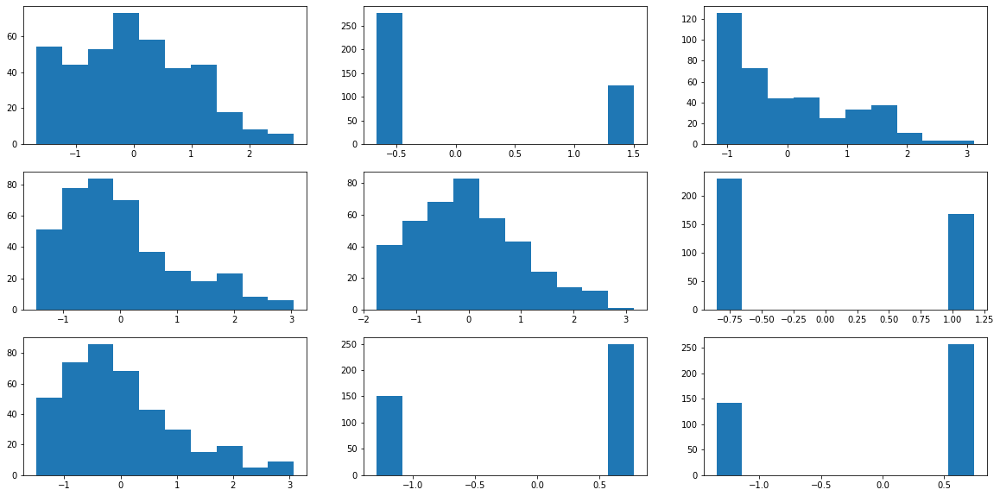

In [41]:
fig, ax = plt.subplots(3,3,figsize=(20,10))
count=0
for i in range(0,3):
    for j in range(0,3):
        ax[i,j].hist(x_train[:,count])
        count+=1

In [39]:
normal=lambda x:(x-np.mean(x,axis=0))/(np.std(x,axis=0))

In [40]:
x_train,x_validation,x_test=normal(x_train),normal(x_validation),normal(x_test)

In [28]:
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import *
from tensorflow.keras.callbacks import EarlyStopping

층의 개수, 층별 뉴런 개수를 하이퍼파라미터로 하는 MLP 생성.

* 요약

층별 뉴런이 많을 땐 학습 속도 (loss가 감소하는 속도)도 느렸고
오버피팅도 어느정도 발생했었음
층별 뉴런 개수를 줄이니 이것이 완화됨.
학습률 조정을 통해 학습 속도 개선 효과 있음.
전형적인 역지수 함수 그래프가 나옴. 일정 수준을 넘어서는 손실함수 값 감소가 더뎌짐.
손실함수 값은 감소하지만 accuracy는 크게 변하지 않음. 다른 하이퍼파라미터 개선이 필요해 보임.

10부터 시작해 10의 배수로 40까지 뉴런, 0.00005에서 시작해 0.00001의 step으로 0.0001까지 200에폭으로 테스트해본 결과,10개의 뉴런과 0.00005의 학습률을 설정했을때 트레이닝 셋과 검증 셋의 손실 함수 값의 차이가 가장 작았다.

반면, 트레이닝 셋의 로스가 가장 작은 경우는 10개 뉴런, 0.0001의 학습률을 설정했을때 가장 작았다.


In [223]:
def MLP(neurons,nlayer):
    Injury=keras.Sequential()
    He=keras.initializers.he_normal()
    Injury.add(Dense(units=int(neurons),input_shape=(9,),activation="relu",kernel_initializer=He,kernel_regularizer=l2(0.001)))
    if int(nlayer)>=2:
        Dropout(0.5)
        Injury.add(Dense(units=int(neurons)/2,activation="relu")) #두번째 층 
        if int(nlayer)>=3:
            Dropout(0.5)
            Injury.add(Dense(units=int(neurons)/2,activation="relu"))
            if int(nlayer)>=4:
                Dropout(0.5)
                Injury.add(Dense(units=int(neurons)/2,activation="relu"))
                if int(nlayer)>=5:
                    Dropout(0.5)
                    Injury.add(Dense(units=int(neurons)/2,activation="relu"))
    Dropout(0.8)
    Injury.add(Dense(units=2,activation="softmax"))

    optimizer=keras.optimizers.Adam(decay=0.0005,learning_rate=0.0001)
    Injury.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])
    Fit=Injury.fit(x_train,y_train,
          epochs=150,shuffle=True,
          validation_data=(x_validation,y_validation),
          batch_size=20,
          callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience=5,factor=0.2,min_lr=0.00001,verbose=1),
              EarlyStopping(patience=20,monitor='val_accuracy')])
    return Fit,Injury

2층 30 뉴런 / 16 조합 중 1 개 완료
Epoch 1/150
20/20 [==============================] - 0s 6ms/step - loss: 1.3391 - accuracy: 0.4025 - val_loss: 1.3098 - val_accuracy: 0.4253
Epoch 2/150
20/20 [==============================] - 0s 848us/step - loss: 1.2809 - accuracy: 0.4075 - val_loss: 1.2596 - val_accuracy: 0.4368
Epoch 3/150
20/20 [==============================] - 0s 798us/step - loss: 1.2277 - accuracy: 0.4200 - val_loss: 1.2127 - val_accuracy: 0.4368
Epoch 4/150
20/20 [==============================] - 0s 831us/step - loss: 1.1800 - accuracy: 0.4225 - val_loss: 1.1690 - val_accuracy: 0.4598
Epoch 5/150
20/20 [==============================] - 0s 798us/step - loss: 1.1361 - accuracy: 0.4325 - val_loss: 1.1285 - val_accuracy: 0.4598
Epoch 6/150
20/20 [==============================] - 0s 836us/step - loss: 1.0971 - accuracy: 0.4450 - val_loss: 1.0924 - val_accuracy: 0.4368
Epoch 7/150
20/20 [==============================] - 0s 898us/step - loss: 1.0605 - accuracy: 0.4350 - val_loss: 1.060

20/20 [==============================] - 0s 848us/step - loss: 0.7405 - accuracy: 0.6125 - val_loss: 0.8440 - val_accuracy: 0.4943
Epoch 30/150
20/20 [==============================] - 0s 886us/step - loss: 0.7399 - accuracy: 0.6150 - val_loss: 0.8449 - val_accuracy: 0.5057
Epoch 31/150
20/20 [==============================] - 0s 898us/step - loss: 0.7395 - accuracy: 0.6150 - val_loss: 0.8454 - val_accuracy: 0.5172
Epoch 32/150
20/20 [==============================] - 0s 848us/step - loss: 0.7387 - accuracy: 0.6150 - val_loss: 0.8446 - val_accuracy: 0.5057
Epoch 33/150
 1/20 [>.............................] - ETA: 0s - loss: 0.6841 - accuracy: 0.8000
Epoch 00033: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
20/20 [==============================] - 0s 898us/step - loss: 0.7384 - accuracy: 0.6175 - val_loss: 0.8443 - val_accuracy: 0.5057
Epoch 34/150
20/20 [==============================] - 0s 848us/step - loss: 0.7374 - accuracy: 0.6175 - val_loss: 0.8444 - val_ac

Epoch 42/150
104/104 [==============================] - 0s 479us/step - loss: 0.8118 - accuracy: 0.5481
3층 30 뉴런 / 16 조합 중 5 개 완료
Epoch 1/150
20/20 [==============================] - 0s 6ms/step - loss: 0.9192 - accuracy: 0.4250 - val_loss: 0.9326 - val_accuracy: 0.4023
Epoch 2/150
20/20 [==============================] - 0s 894us/step - loss: 0.8897 - accuracy: 0.4550 - val_loss: 0.9110 - val_accuracy: 0.3793
Epoch 3/150
20/20 [==============================] - 0s 898us/step - loss: 0.8661 - accuracy: 0.4650 - val_loss: 0.8921 - val_accuracy: 0.4023
Epoch 4/150
20/20 [==============================] - 0s 848us/step - loss: 0.8459 - accuracy: 0.4750 - val_loss: 0.8775 - val_accuracy: 0.3793
Epoch 5/150
20/20 [==============================] - 0s 848us/step - loss: 0.8294 - accuracy: 0.4975 - val_loss: 0.8656 - val_accuracy: 0.3908
Epoch 6/150
20/20 [==============================] - 0s 898us/step - loss: 0.8165 - accuracy: 0.5125 - val_loss: 0.8550 - val_accuracy: 0.4138
Epoch 7/150
20

20/20 [==============================] - 0s 848us/step - loss: 0.7793 - accuracy: 0.5375 - val_loss: 0.7878 - val_accuracy: 0.5862
Epoch 9/150
20/20 [==============================] - 0s 877us/step - loss: 0.7745 - accuracy: 0.5425 - val_loss: 0.7861 - val_accuracy: 0.5517
Epoch 10/150
20/20 [==============================] - 0s 898us/step - loss: 0.7708 - accuracy: 0.5575 - val_loss: 0.7850 - val_accuracy: 0.5402
Epoch 11/150
20/20 [==============================] - 0s 848us/step - loss: 0.7672 - accuracy: 0.5900 - val_loss: 0.7840 - val_accuracy: 0.5287
Epoch 12/150
20/20 [==============================] - 0s 848us/step - loss: 0.7641 - accuracy: 0.6075 - val_loss: 0.7836 - val_accuracy: 0.5287
Epoch 13/150
20/20 [==============================] - 0s 898us/step - loss: 0.7615 - accuracy: 0.6225 - val_loss: 0.7834 - val_accuracy: 0.5402
Epoch 14/150
20/20 [==============================] - 0s 891us/step - loss: 0.7592 - accuracy: 0.6200 - val_loss: 0.7835 - val_accuracy: 0.5287
Epoch 

104/104 [==============================] - 0s 499us/step - loss: 0.8233 - accuracy: 0.5865
4층 30 뉴런 / 16 조합 중 9 개 완료
Epoch 1/150
20/20 [==============================] - 0s 6ms/step - loss: 0.8091 - accuracy: 0.4775 - val_loss: 0.7854 - val_accuracy: 0.4483
Epoch 2/150
20/20 [==============================] - 0s 898us/step - loss: 0.7955 - accuracy: 0.4975 - val_loss: 0.7788 - val_accuracy: 0.4713
Epoch 3/150
20/20 [==============================] - 0s 848us/step - loss: 0.7850 - accuracy: 0.5250 - val_loss: 0.7735 - val_accuracy: 0.4828
Epoch 4/150
20/20 [==============================] - 0s 898us/step - loss: 0.7758 - accuracy: 0.5250 - val_loss: 0.7695 - val_accuracy: 0.4828
Epoch 5/150
20/20 [==============================] - 0s 898us/step - loss: 0.7685 - accuracy: 0.5225 - val_loss: 0.7663 - val_accuracy: 0.4828
Epoch 6/150
20/20 [==============================] - 0s 897us/step - loss: 0.7622 - accuracy: 0.5350 - val_loss: 0.7639 - val_accuracy: 0.4828
Epoch 7/150
20/20 [========

20/20 [==============================] - 0s 848us/step - loss: 0.7743 - accuracy: 0.6175 - val_loss: 0.8413 - val_accuracy: 0.5632
Epoch 21/150
20/20 [==============================] - 0s 848us/step - loss: 0.7741 - accuracy: 0.6200 - val_loss: 0.8413 - val_accuracy: 0.5632
Epoch 22/150
20/20 [==============================] - 0s 848us/step - loss: 0.7738 - accuracy: 0.6200 - val_loss: 0.8414 - val_accuracy: 0.5632
Epoch 23/150
20/20 [==============================] - 0s 898us/step - loss: 0.7736 - accuracy: 0.6200 - val_loss: 0.8414 - val_accuracy: 0.5632
Epoch 24/150
20/20 [==============================] - 0s 898us/step - loss: 0.7734 - accuracy: 0.6200 - val_loss: 0.8415 - val_accuracy: 0.5517
Epoch 25/150
20/20 [==============================] - 0s 848us/step - loss: 0.7732 - accuracy: 0.6200 - val_loss: 0.8416 - val_accuracy: 0.5517
Epoch 26/150
20/20 [==============================] - 0s 848us/step - loss: 0.7730 - accuracy: 0.6200 - val_loss: 0.8416 - val_accuracy: 0.5517
Epoch

Epoch 15/150
20/20 [==============================] - 0s 889us/step - loss: 0.7359 - accuracy: 0.6000 - val_loss: 0.7772 - val_accuracy: 0.5517
Epoch 16/150
20/20 [==============================] - 0s 905us/step - loss: 0.7356 - accuracy: 0.6000 - val_loss: 0.7772 - val_accuracy: 0.5517
Epoch 17/150
20/20 [==============================] - 0s 898us/step - loss: 0.7353 - accuracy: 0.6025 - val_loss: 0.7772 - val_accuracy: 0.5517
Epoch 18/150
20/20 [==============================] - 0s 848us/step - loss: 0.7351 - accuracy: 0.6050 - val_loss: 0.7773 - val_accuracy: 0.5517
Epoch 19/150
 1/20 [>.............................] - ETA: 0s - loss: 0.8035 - accuracy: 0.5500
Epoch 00019: ReduceLROnPlateau reducing learning rate to 1e-05.
20/20 [==============================] - 0s 898us/step - loss: 0.7348 - accuracy: 0.6050 - val_loss: 0.7774 - val_accuracy: 0.5517
Epoch 20/150
20/20 [==============================] - 0s 848us/step - loss: 0.7346 - accuracy: 0.6050 - val_loss: 0.7774 - val_accura

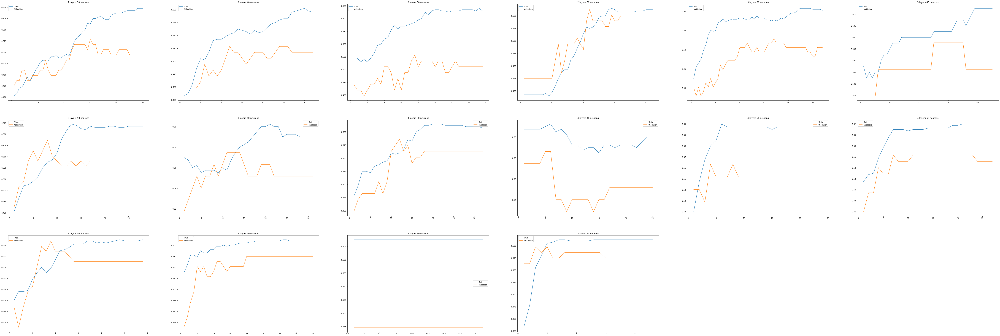

In [230]:
neurons=[]
Learningrate=[]
Loss=[]
Valloss=[]
test_acc=[]
nlayers=[]
train_acc=[]
val_acc=[]
count=0
L=plt.figure(figsize=(100,70))
##Ac=plt.figure(figsize=(200,70))
for nlay in np.arange(2,6,1):
    for idx,n in enumerate(np.arange(30,70,10)):
            print('{}층 {} 뉴런 / 16 조합 중 {} 개 완료'.format(nlay,round(n,5),count+1))
            count+=1
            Fit,Injury=MLP(n,nlay)
            loss=Fit.history['loss'][-1]
            valloss=Fit.history['val_loss'][-1]
            ax=L.add_subplot(6,6,count)
            ax.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['accuracy'])
            ax.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['val_accuracy'])
            plt.legend(['Train','Validation'])
            plt.title('{} layers {} neurons'.format(nlay,n))
            ##Ax2=Ac.add_subplot(6,16,count)
            ##Ax2.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['accuracy'])
            ##Ax2.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['val_accuracy'])
            ##plt.legend(['Train','Validation'])
            ##plt.title('{} layers {} neurons, {} lr'.format(nlay,n,lr))
            
            nlayers.append(nlay)
            neurons.append(n)
            Loss.append(loss)
            Valloss.append(valloss)
            test_acc.append(Injury.evaluate(x_test,y_test,batch_size=1)[1])
            train_acc.append(Fit.history['accuracy'][-1])
            val_acc.append(Fit.history['val_accuracy'][-1])

In [43]:
from tensorflow.keras.models import load_model
Injury.save('Injury_prone_First.h5')

In [233]:
Log=pd.concat([pd.concat([pd.concat([pd.concat([pd.DataFrame(nlayers),pd.DataFrame(neurons)],axis=1),
             pd.DataFrame(Loss)],axis=1),
               pd.concat([pd.DataFrame(Valloss),pd.DataFrame(test_acc)],axis=1)],axis=1),
               pd.concat([pd.DataFrame(train_acc),pd.DataFrame(val_acc)],axis=1)],axis=1)
Log.columns=["Layers",'Neurons','Loss',"Val_loss","Test_Acc","Test_acc","Val_acc"]
Log=pd.concat([Log,pd.DataFrame(abs(Log['Loss']-Log['Val_loss']),)],axis=1)
Log=pd.concat([Log,pd.DataFrame(abs(Log['Test_Acc']-Log['Val_acc']),)],axis=1)
Log.rename(columns={0:'Diff'},inplace=True)
Log.columns=["Layers",'Neurons','Loss',"Val_loss","Test_Acc","Test_acc","Val_acc","Loss Diff","Acc Diff"]

In [237]:
Log.sort_values(['Acc Diff','Val_acc'])

,Layers,Neurons,Loss,Val_loss,Test_Acc,Test_acc,Val_acc,Loss Diff,Acc Diff
3,2,60,0.789729,0.823092,0.548077,0.5625,0.551724,0.033362,0.003647
9,4,40,0.748122,0.810811,0.538462,0.6000,0.551724,0.062689,0.013263
0,2,30,0.731618,0.813724,0.509615,0.5975,0.494253,0.082106,0.015363
11,4,60,0.772743,0.841597,0.567308,0.6200,0.551724,0.068853,0.015584
5,3,40,0.740314,0.776871,0.567308,0.6125,0.586207,0.036557,0.018899
13,5,40,0.732325,0.777804,0.596154,0.6100,0.574713,0.045479,0.021441
14,5,50,0.755381,0.806076,0.596154,0.6075,0.574713,0.050694,0.021441
6,3,50,0.748982,0.785028,0.567308,0.6175,0.540230,0.036046,0.027078
15,5,60,0.782241,0.809525,0.605769,0.6125,0.574713,0.027284,0.031057
8,4,30,0.728630,0.758328,0.528846,0.6075,0.563218,0.029697,0.034372


In [385]:
Injury=keras.Sequential()
He=keras.initializers.he_normal()
Dropout(0.5)
Injury.add(Dense(units=20,input_shape=(9,),activation="relu",kernel_initializer=He,kernel_regularizer=l2(0.001)))
Dropout(0.5)
Injury.add(Dense(units=10,activation="relu")) #두번째 층 
Dropout(0.5)
Injury.add(Dense(units=5,activation="relu"))
Dropout(0.8)
Injury.add(Dense(units=2,activation="softmax"))
optimizer=keras.optimizers.Adam(decay=0.001,learning_rate=0.003)
Injury.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])
Fit=Injury.fit(x_train,y_train,
          epochs=100,shuffle=True,
          validation_data=(x_validation,y_validation),
          batch_size=1,
          callbacks=[tf.keras.callbacks.ReduceLROnPlateau(patience=5,factor=0.2,min_lr=0.00001,verbose=1),
              EarlyStopping(patience=20,monitor='val_loss')])

Epoch 1/100
400/400 [==============================] - 0s 649us/step - loss: 0.7288 - accuracy: 0.5800 - val_loss: 0.7284 - val_accuracy: 0.5747
Epoch 2/100
400/400 [==============================] - 0s 391us/step - loss: 0.7044 - accuracy: 0.6125 - val_loss: 0.7427 - val_accuracy: 0.5747
Epoch 3/100
400/400 [==============================] - 0s 390us/step - loss: 0.6968 - accuracy: 0.6075 - val_loss: 0.7606 - val_accuracy: 0.5862
Epoch 4/100
400/400 [==============================] - 0s 386us/step - loss: 0.6920 - accuracy: 0.6100 - val_loss: 0.7515 - val_accuracy: 0.5747
Epoch 5/100
400/400 [==============================] - 0s 384us/step - loss: 0.6855 - accuracy: 0.6175 - val_loss: 0.7760 - val_accuracy: 0.5632
Epoch 6/100
317/400 [======================>.......] - ETA: 0s - loss: 0.6743 - accuracy: 0.6341  
Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0006000000052154065.
400/400 [==============================] - 0s 390us/step - loss: 0.6793 - accuracy: 0.6175 - val

100 에폭에 earlystopping까지 작동 시킨 결과, 학습과 검증 셋의 정확도가 매우 상이한, 전형적인 오버피팅의 문제를 보였다. 

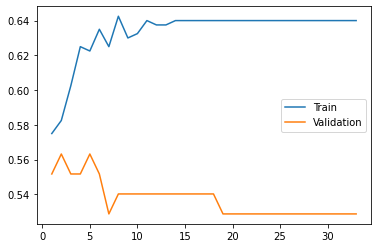

In [382]:
plt.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['accuracy'])
plt.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['val_accuracy'])
plt.legend(['Train','Validation'])

피팅된 모델로 시험 셋 예측 정확도는 매우 좋지 못하다.

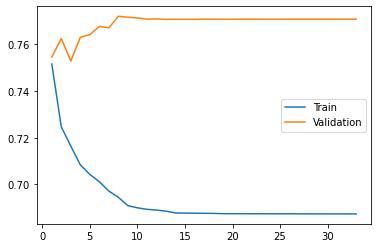

In [383]:
plt.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['loss'])
plt.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['val_loss'])
plt.legend(['Train','Validation'])

In [351]:
Injury.evaluate(x_test,y_test,batch_size=1)

104/104 [==============================] - 0s 288us/step - loss: 0.8280 - accuracy: 0.5481


[0.8279587030410767, 0.5480769276618958]

In [191]:
Log.loc[Log['Neurons']==10]

,Neurons,Learning_Rate,Loss,Val_loss,Diff
0,10,0.00005,0.780985,0.781868,0.000882
1,10,0.00006,0.797277,0.819893,0.022616
2,10,0.00007,0.775371,0.803276,0.027905
3,10,0.00008,0.752014,0.760814,0.008800
4,10,0.00009,0.742969,0.755262,0.012293
5,10,0.00010,0.737842,0.775531,0.037688


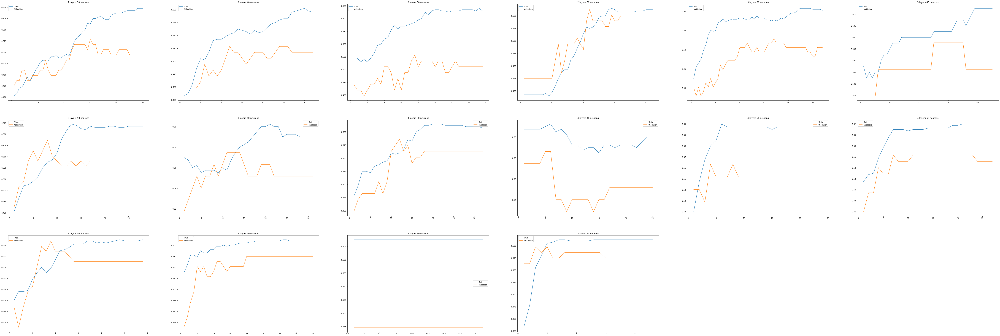

In [386]:
from IPython.display import Image as image
image('C:/Users/icako/Downloads/다운로드 (2).png')

대부분의 뉴런 개수에서 학습률의 증가는 손실함수 감소 트렌드로 이어졌고, 뉴런개수가 증가할수록 동일 학습률에서 더욱 높은 loss를 보였다.

뉴런이 많아질수록 오버피팅 문제는 심화되었고,동일 뉴런 개수일때는 학습률과 오버피팅은 크게 연관이 없는 것으로 확인된다.

데이터의 크기가 그렇게 크지 않기 때문에, 층내 뉴런이 많을수록 오버피팅이 발생하는 것으로 보인다.

즉, 뉴런이 10개일때 loss값이 가장 작고, 오버피팅이 비교적 적게 발생한다.

뉴런이 10개일때 각 학습률 별 결과는 상이했다. 학습률이 0.00005보다 커지게 되면 검증 셋의 로스 값의 감소가 둔화되어 최종적으론 학습 셋의 로스와 큰 차이가 나기도 했다. 일부 학습률에서는 그 정도가 비교적 작기는 했지만, 학습률이 0.00005일때 이상적인 그래프가 나왔다.

따라서, 뉴런의 개수를 10개로 설정한뒤, 층의 개수와 (더 작은 학습률)로 다시 테스트를 해보기로 한다.

층의 개수가 5개, 학습률이 0.00005일때 loss가 가장 작았지만, 약간의 오버피팅이 발생한다.
층의 개수가 4개, 학습률이 0.00002일때는 가장 오버피팅이 덜 발생하면서 비교적 loss도 작았다.
층의 개수 4개, 학습률이 0.00005일때 오버피팅이 어느정도 발생하지 않으면서 loss도 작았다.

층의 개수 4개, 학습률 0.00005이 가장 이상적인 결과를 낳는것으로 판단할 수 있겠다.

학습률이 아닌 로스 증감율 그래프는 오버피팅의 정도가 정확도 그래프때에 비해 완화되어 보인다.

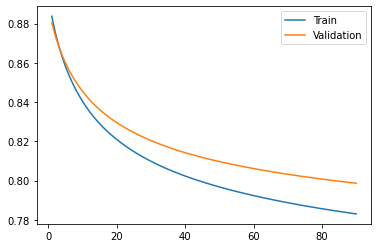

In [250]:
plt.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['loss'])
plt.plot(np.arange(1,len(Fit.epoch)+1,1),Fit.history['val_loss'])
plt.legend(['Train','Validation'])

fitted probability와 실제 부상 발생 여부에는 눈에 띄는 패턴은 보이지 않는다.

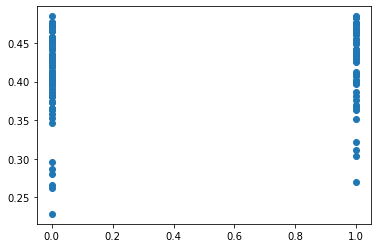

In [257]:
plt.scatter(y_test,Injury.predict(x_test))

In [ ]:
Predict=pd.read_csv('Origin.csv',encoding='CP949')

In [ ]:
Predict=Predict.loc[Predict['연도']==2021]

In [101]:
Predict=pd.merge(Predict,Set[['이름','큰수술경험']],left_on='이름',right_on='이름',how='left')

In [102]:
Predict.isna().sum()

이름       0
연도       0
나이       0
출장       0
선발       0
이닝       0
투구       0
유망주      0
연차       0
가중이닝     0
가중출장     0
누적이닝     0
가중투구     0
선발불펜     0
큰수술경험    2
dtype: int64

실수로 큰 수술 경험란에 숫자를 기입하지 않은 경우가 있었나보다.
0을 대입하여 향후 시즌 예측을 위한 입력 변수 데이터를 완성해준다.

In [103]:
Predict.fillna(0,inplace=True)

학습, 검증, 시험 셋의 입력 변수에 했던 것처럼 정규화와 포맷을 변경해준다.

In [104]:
Predictx=Predict[['나이','유망주','연차','가중이닝','가중출장','누적이닝','가중투구','선발불펜','큰수술경험']]
Predictx=np.array(Predictx).reshape(-1,9).astype('float32')

In [105]:
Predictx=normal(Predictx)

부상 예측 가능성을 시각화하여 정리한 자료는 아래 링크에서 열람 가능.

https://public.tableau.com/app/profile/.25246435/viz/_16471797439000/1?publish=yes

Evaluation

● 모델의 정확도 (accuracy)는 약 0.6정도에 불과했으며, 시험 셋의 정확도는 더 낮은 0.5698이었다. 정확도가 0.6에 불과한 모델의 타당성을 의심해봄직 하다. 또한, 학습과 시험 셋의 로스와 정확도에서 큰 차이가 발생하기 때문에 오버피팅이 문제를 효율적으로 해결하지 못한 것으로 결론 지을 수 있다.



● 학습 셋의 정확도 자체는 뉴런의 개수나 층의 개수를 증가시킴으로써 0.9 이상까지 향상된 경우도 있었으나, 오버피팅 문제는 해결되지 않았다. 따라서, 본 모델은 오버피팅 측면에서 치명적인 오류를 가지고 있다.



● 오버피팅이 발생하는 이유: 오버피팅은 학습셋의 크기가 작으면서 모델이 지나치게 복잡 (뉴런의 개수나 층의 개수가 필요 이상으로 많은 경우)한 경우 발생한다. 반면에, 모델에 사용된 420의 학습 셋 크기가 과연 수많은 부상 케이스를 일괄적으로 분석하기에 적당한지 의문이 든다. 태생적으로 원본에서 사용된 데이터는 오버피팅에 취약할 수 밖에 없으며, 정확도& loss와 오버피팅의 적절한 trade-off를 감안하여 모델을 설계해야했다. (모델이 지나치게 복잡하면 오버피팅의 정도가 높아지고 모델이 지나치게 간단하면 정확도와 loss가 너무 낮기 때문이다).



● 오버피팅은 여러 수단으로 완화할 수 있다. 그 중 가장 문제를 해결해주는 근본적인 해결책은 데이터의 크기를 증가시키는 것이다. 애석하게도 본 작업처럼 실제 기록을 사용하는 경우에는 마땅한 방법이 없다. 그러나, 이미지 원자료의 경우에는 data-augmentation을 통해 원자료의 크기를 증가시켜 오버피팅을 완화할 수 있다. Data-augmentation은 한장의 이미지를 좌우 반전 시키거다 90도 회전 시켜 여러 개의 파생 이미지를 생성하는 작업이다. 데이터의 크기가 커진만큼 오버피팅을 비교적 완화할 수 있는 점에서 애용된다.



잠재변수



● 데이터 크기 외에도 수집한 자료가 과연 출력값에 영향을 주는 잠재적인 변수를 포함했는지 의문이 든다. 부상 예측은 단순한 시즌 기록 외에도 메디컬 테스트나 실제 신체 피로 누적도을 반영해야 효과적으로 이루어질 수 있다. 불펜 투수의 연투, 3연투, 4연투 횟수를 반영했다면 더욱 정교한 모델을 생성할 수 있었을 것 같다. (다만 데이터를 취득 소요시간이 매우 길다).



● 투구폼 상의 injury prone 정도: 아쉽지만 트레이너나 선출이 아니라 전문적으로 평가하기가 어려워 고려하지 않음.

부상 부위, 정도, 잔존 여파 등을 구체적으로 분류해야지 더욱 효과적인 결과가 산출될 것 같다.



추가 연구

더욱 풍성한 원자료 취득이 가능하다면 (A deep learning approach to injury forecasting in NBA basketball,https://content.iospress.com/articles/journal-of-sports-analytics/jsa200529) 연구를 참고해볼만 하다. 언급한 연구에서는 시즌 직후 부상 가능성 예측이 아니라, NBA 선수들의 과거 5경기 경기 기록 (출장 시간, 나이, 지역, 코치)와 부상 이력을 반영하여 다음 경기에서 부상이 발생 여부를 예측한다. 위 연구처럼 자료 수집이 가능하다면 경기 단위로 부상 가능성을 계산하는 것이 직관적으로도 효율적인 것으로 보인다.


양질의 데이터와 메디컬에 대한 이해도가 갖추어져야 더욱 신뢰할만한 모델을 생성할 수 있다 결론지을 수 있다. 구단내에서 별도로 관리하는 메디컬 리포트나 부상일지에 접근할 수 있으면 좋겠다는 생각이 든다. 보다 대중에게 데이터를 더욱 자유롭게 공개하는 MLB의 데이터 베이스를 검색하여 비슷한 프로젝트를 진행하여 모델을 완성하는 것이 남은 과제이다.
